## Auto Mosaicing Algorithm
`Environment: Python 3.9.12, dependencies and command for installing with anaconda in env.txt`

This program loosely follows the paper "Recognizing Panoramas" by Matthew Brown.  Originally I set out to implement the entire panorama pipeline as laid out in the paper, but due to time constraints have implemented the main thrust of the paper, "recognizing panoramas" amidst mixed sets of unordered images.  My general process follows this outline sequence:

1.  Compute each image's features (SIFT features are used for resilience against camera zoom effects causing scale changes in features)
2.  Image pairing:
    - a. For each image, compute feature matches between itself and each other image (use KD-Tree for speed, find good balance of speed and quality of results)
    - b. Compute a homography for each of these image pairings with the resulting matches.
    - b. Eliminate image pairings that either did not succeed in RANSAC homography estimation or do not meet some basic quality criteria (inlier ratio, number of inliers).
    - c. Rank each image's potential homographies in order of quality.
3. Finding connected sets.  Starting with the first image:
    - a. Consider this image and its best match a set.
    - b. Recursively search through all images finding images whose best match is included in the set already, adding these images to the set.
    - c. Continue recursion until an iteration does not add any new images to the set.
    - d. With remaining images, start the process again creating another connected set until all images have been placed in a set.
4. Stitching images.
    - a.  Compute each image's global homography
        * find first image to place(image with best homography quality) and set its homography to a transform to place it in the center of the canvas
        * recursively find the next image by searching for images whose best pair image has already had its global homography calculated
        * calculate each image's global homography by taking the dot product of the already transported image with the current image
        * repeat loop until every image has a global homography
    - b.  Since each image's original homography was calculated in a forward direction, the same in which it is placed on the canvas, no further homography transformations are needed, just use cv2's warpTransform to place each image in the canvas
    - c.  Crop out unecessary space and render



#### Things to improve after this course:
* perform better homography quality control to completely eliminate false positives
    * compare overlapped areas of images and throw away homographies that have too small of an inlier ratio within the overlap area
* pre-determine image grouping with a time threshold using any file metadata (images taken more than several days apart won't be considered)
* include option to write image match data to files after computation so that extremely large sets of images can be stitched without maxxing out RAM
* perform bundle optimization, gain compensation, and mosaic straightening

#### Test Runs
At the end of this file are multiple test runs that arrange the images in a number of different ways to demonstrate the program working fine in most scenarios, including
* ordered/randomized images
* small/large sets of images
* 1D/2D panoramas
* clean and noisy image sets

### Results
This algorithm works fairly well for all the given scenarios, it could be faster by utilizing a more reliable homography quality check so that once m number of pairs are found that meet the high standard, then an image can be considered as matched rather than comparing to every other image.  One very large image sets, it can begin to experience false negatives and the mosaics that would normally stitch well when done independently will fail to stitch.  There likely needs to be a better tuning of the flann tree and homography threshold parameters, or an adaptive set of parameters.


In [19]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid
import cv2
import numpy as np
import sys
import math
import random
import time
import os

# Get the current working directory
cwd = os.getcwd()

# Print the current working directory
print("Current working directory: {0}".format(cwd))

pathToImagesFromCwd = '/images'

try:
    os.chdir(os.getcwd() + pathToImagesFromCwd)
    cwd = os.getcwd()
    print("Changed to: {0}".format(cwd))
except Exception:
    print('Already in images directory')

Current working directory: c:\Users\austi\dev\auto-stitch\images
Already in images directory


#### Define helper classes
Some reusable utility functions are first added

In [3]:
def log(output):
    if options.logOutput is True:
        sys.stdout.write(output)

def logVerbose(output):
    if options.logOutput is True and options.logVerbose is True:
        sys.stdout.write(output)
def logFn(fn):
    if options.logOutput is True:
        fn()

def logPlot(fn):
    if options.logPlots is True:
        fn()
        
class Options:
    def __init__(self):
        self.useNBestFeatureMatches = 600
        self.homographyRansacError = 1
        self.homographyMinMatchCount = 20
        self.homographyInlierRatioThreshold = 0.8
        self.homographyMinInliers = 100
        self.logOutput = True
        self.logVerbose = False
        self.logPlots = True
        self.matchCountThreshold = 100
        self.matchingDistanceThreshold = 150
        self.shuffleImages = False
        self.numSiftFeatures = 5000
        self.previewImageSet = True

options = Options()

def gridPlot(x=None, y=None, imgs=[], figsize=(10, 10), titles=[], title=''):
    num = len(imgs)

    if x is not None:
        y = math.ceil(num / x)
    elif y is not None:
        x = math.ceil(num / y)
    else:
        x = 6
        y = math.ceil(num / x)
    
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                    nrows_ncols=(y, x),  # creates 2x2 grid of axes
                    axes_pad=0.3,  # pad between axes in inch.
                    )
    fillBlank = x*y - num
    blanks = []

    for i in range(0, fillBlank):
        imgs.append(255*np.ones((imgs[-1].shape[0], imgs[-1].shape[1], 3)).astype(int))

    for idx, (ax, im) in enumerate(zip(grid, imgs + blanks)):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        if idx < len(titles):
            ax.set_title(titles[idx])

    plt.show()

class Timer:
    def __init__(self):
        self.start = time.time()
        self.end = None
    
    def finish(self):
        self.end = time.time()
        elapsed = self.end - self.start
        return elapsed

def displayIm(im, title='Result',showFlag=True, size=None):
  max = np.amax(im)
  min = np.amin(im)
  normalized = (((im - min) / (max - min)) * 255).astype(int)
  fig, ax = plt.subplots()
  if size:
    fig.set_figheight(size)
    fig.set_figwidth(size)

  plt.title(title)
  plt.xticks([]), plt.yticks([]) #  axis label off
  if showFlag: plt.imshow(normalized, cmap='gray', aspect='equal')

def blackOut(img):
  img = img.astype(np.uint8)
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8) 
    x,y,w,h=cv2.boundingRect(mask)
    return img[y:y+h,x:x+w,:]
  else:
    mask = np.array((img > 0), np.uint8) 
    x,y,w,h=cv2.boundingRect(mask)
    return img[y:y+h,x:x+w]

def showKP(im,kp,title='', show=True):
  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
  cv2.drawKeypoints(im,kp,flags=flags, outImage=im)
  if show:
    displayIm(im, title=title, size=10)
  return im

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches', matchMode='BF', matchesMask=None):
  im1 = showKP(im1, kp1, show=False)
  im2 = showKP(im2, kp2, show=False)
  flags=2
  if matchMode == 'BF':
    im = cv2.drawMatches(im1,kp1,im2,kp2,matches[:N],None,flags=2)
    displayIm(im, title=title, size=14)
  elif matchMode == 'KNN':
    im = cv2.drawMatchesKnn(im1, kp1, im2, kp2, matches1to2=matches[:N], outImg=None, flags=flags)
    displayIm(im, title=title, size=14)

#### Auxiliary classes
Classes to help hold information and manage images

In [4]:
class Image:
    def __init__(self, image, pathname=''):
        self.color = image.copy()
        self.pathname = pathname
        self.bw = cv2.cvtColor(self.color,cv2.COLOR_RGB2GRAY)
        kp,ds = self.computeFeatures()
        self.keypoints = kp
        self.descriptors = ds
        self.pairs = list()
        self.finalPair = None
        self.H = None

    # get SIFT features
    def computeFeatures(self):
        sift = cv2.SIFT_create(options.numSiftFeatures)
        kp, ds = sift.detectAndCompute(self.bw, None)
        return kp, ds

    def addPotentialMatch(self, potentialMatch):
        self.pairs.append(potentialMatch)

    def computePairHomographies(self, imageDict):
        for p in self.pairs:
            p.computeHomography(imageDict[p.key1], imageDict[p.key2])

    def cullInvalidHomographies(self):
        removedPairInfo = []
        for p in list(self.pairs):
            if p.invalid is True:
                removedPairInfo.append(p.inlierRatio)
                self.pairs.remove(p)
        return removedPairInfo
    
    # descending order of homography quality
    def sortPairsByQuality(self):
        self.pairs = sorted(self.pairs, key=lambda x:(x.numInliers, x.inlierRatio))[::-1]

    def computeBestPair(self):
        # for now just select first pair (orderd in descending order of homography quality)
        if len(self.pairs) > 0:
            self.finalPair = self.pairs[0]
    
    def getPairKeys(self):
        keys = []

        for p in self.pairs:
            keys.append(p.key2)
        
        return keys


# Holds information regarding a match between two images
class PotentialImagePair:
    H = None

    def __init__(self, imKey1, imKey2, matches, matchType='BF'):
        self.key1 = imKey1
        self.key2 = imKey2
        self.matches = []
        self.numInliers = 0
        self.numOutliers = 0
        self.inlierRatio = 0
        self.inlierMask = None
        self.fundamentalMat = None
        self.invalid = False
        if matchType == 'BF':
            goodMatches = matches
        elif matchType == 'KNN':
            goodMatches = [i for i, j in matches if i.distance < 0.2 * j.distance]
        s = sorted(goodMatches, key=lambda x:x.distance)
        self.cumulativeNMatchesDistance = 0
        
        for m in s:
            self.cumulativeNMatchesDistance+=m.distance
            self.matches.append(m)

    def validateHomography(self, im1, im2):
        maxSkewFactor = .002

        if self.H is None:
            self.invalid = True
        elif self.H[2, 0] > maxSkewFactor or self.H[2, 1] > maxSkewFactor:
            self.invalid = True
        elif self.inlierRatio < options.homographyInlierRatioThreshold:
            self.invalid = True
        elif self.numInliers < options.homographyMinInliers:
            self.invalid = True

    def computeHomography(self, im1, im2):
        H = None
        mask = []
        if len(self.matches)>options.homographyMinMatchCount:
            src_pts=[]
            dst_pts=[]
            for m in self.matches:
                (x1, y1) = im1.keypoints[m.queryIdx].pt
                (x2, y2) = im2.keypoints[m.trainIdx].pt

                src_pts.append((x1, y1)) 
                dst_pts.append((x2, y2))
            src_pts=np.array(src_pts)
            dst_pts=np.array(dst_pts)
            H, mask = cv2.findHomography(src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=options.homographyRansacError, confidence=0.995)
            self.numInliers = list(mask).count(1)
            self.numOutliers =list(mask).count(0)

            self.inlierMask = list(mask)
            self.cumulativeNMatchesDistance = 0
            for i, m in enumerate(self.matches):
                if 1 in self.inlierMask[i]:
                    self.cumulativeNMatchesDistance+=m.distance
            self.inlierRatio = self.numInliers/(self.numInliers + self.numOutliers)

        self.H = H
        self.validateHomography(im1, im2)

# Holds data for groups of connected images
class ConnectedSet:
    def __init__(self, imKeys):
        self.imKeys = list(set(imKeys))
        self.finalIm = None

    def addImKey(self, imKey):
        self.imKeys.append(imKey)
        self.imKeys = list(set(self.imKeys))

    def sortImagesByBestMatchQuality(self, images):
        self.imKeys = sorted(self.imKeys, key=lambda x: (images[x].finalPair.numInliers, images[x].finalPair.inlierRatio))



#### Mosaic class
Initialize this class with a list of image paths, and it will process the images and plot the resulting mosaics. Log options allow for verbose logs and plots along the way.



In [10]:
class Mosaics:
    def __init__(self, imPaths):
        self.images = {}
        self.orphanImages = {}
        self.connectedSets = []
        timer = Timer()

        log('\nSTAGE 01: Read image files')

        for idx, img_path in enumerate(imPaths):
            img = mpimg.imread(img_path)
            
            self.images[idx] = (img_path, img)
        
        if options.previewImageSet is True:
            imgs = [img[1] for (path, img) in self.images.items()]
            print('\nInput Images')

            if len(imgs) < 6:
                x = len(imgs)
                gridPlot(x=x, imgs=imgs)
            else:
                y = x=math.ceil(len(imgs)/6)
                gridPlot(y=y, imgs=imgs)


        log(f'\nFinished in {timer.finish():8.3f} seconds\n')
        
        self.computeFeatures()
        self.computeImagePairings()
        self.computeConnectedSets()
        self.computeGlobalHomographies()
        self.stitchImageSets()

    def computeFeatures(self):
        timer = Timer()
        log('\nSTAGE 02: Compute each image\'s feature points')

        for key in self.images:
            im = self.images[key]
            self.images[key] = Image(im[1], pathname=im[0])

        log(f'\nFinished in {timer.finish():8.3f} seconds\n')
    

    def computeImagePairings(self):
        # iterate through each image and find good pairings to other images
        timer = Timer()
        log('\nSTAGE 03: Computing feature matches among all image pairs:\n')
        pairCount = 0

        for key1, im1 in self.images.items():
            im1 = self.images[key1]
            
            # iterate over every other image, computing match pairs
            for key2, im2 in self.images.items():
                if key1 != key2:
                    pairCount+=1
                    log(f'\rim{key1:2d} ==> im{key2:2d}')

                    FLANN_INDEX_KDTREE = 1
                    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 2)
                    search_params = dict(checks = 15)
                    flann = cv2.FlannBasedMatcher(index_params, search_params)
                    matches = flann.knnMatch(im1.descriptors,im2.descriptors,k=2)

                    pair = PotentialImagePair(key1, key2, matches, 'KNN')
                    im1.addPotentialMatch(pair)

            # compute homographies for all these pairings
            im1.computePairHomographies(self.images)
        
        log(f'\nComputed {pairCount} image  combinations')
        log(f'\nFinished in {timer.finish():8.3f} seconds\n')
    
        # after homographies are computed, prune bad pairings based off inlier ratio
        timer = Timer()
        log(f'\nSTAGE 04: Prune image match pairs that are below homography quality threshold: inlierRatio < {options.homographyInlierRatioThreshold}')

        someCulled = True
        newImDict = dict(self.images)
        while someCulled is True:
            culled = False
            for key, im in self.images.items():
                removed = im.cullInvalidHomographies()
                if len(im.pairs) == 0:
                    if len(newImDict) == len(self.images):
                        log('\nSome images had no good pairings:')
                    if len(removed) > 0:
                        log(f'\nim{key}: highest pair inlierRatio was {sorted(removed)[-1]}')
                    self.orphanImages[key] = im
                    del newImDict[key]
                    culled = True
                    for key2, im2 in self.images.items():
                        for p in list(im2.pairs):
                            if p.key2 == key:
                                im2.pairs.remove(p)
            if culled is False:
                someCulled = False
            self.images = newImDict
                

        log(f'\nFinished in {timer.finish():8.3f} seconds\n')
        
       


        # order image matches by quality and determine the best pair
        log(f'\nSTAGE 05: Compute each image\'s best match (highest inlierRatio)')
        for key, im in self.images.items():
            im.sortPairsByQuality()
            im.computeBestPair()
            if (len(im.pairs) > 0):
                log(f'\nim{key:2d} <==> im{im.finalPair.key2:2d}')
            for p in im.pairs:
                log(f'\n\t* => im{p.key2} inliers: {p.numInliers}, outliers: {p.numOutliers}, ratio: {p.inlierRatio:4.4f}, matches: {len(p.matches)}, accumDistance: {p.cumulativeNMatchesDistance:6.2f}')
        log(f'\nFinished in {timer.finish():8.3f} seconds\n')
        

    # finds other images directly connected to this image key
    @staticmethod
    def __getConnectedTo(imKey, imageDict):
        connectedTo = []
        
        for i in imageDict:
            if imageDict[i].finalPair.key2 == imKey:
                connectedTo.append(i)
        return connectedTo + [imageDict[imKey].finalPair.key2]

    # recursively search for all direct/indirect connections to this image
    def __imConnections(self, imKey, connections, imageDict):
        #pairedWith = self.images[imKey].finalPair.key2
        connectedTo = []

        setPairs = []

        # accumulate keys from N pairs that were matched
        for p in imageDict[imKey].pairs:
            if p.key2 in imageDict.keys():
                setPairs.append(p.key2)


        for i in [imKey] + setPairs:
            c = self.__getConnectedTo(i, imageDict)
            connectedTo = connectedTo + c

        original = connections.copy()
        connections = list(set(connections + connectedTo))

        for i in connectedTo:
            if i not in original and i in [*imageDict.keys()]:
                connections = list(set(connections + self.__imConnections(i, connections, imageDict)))

        return connections
    
    # find image connections, and group into sets
    def computeConnectedSets(self):
        timer = Timer()
        log(f'\nSTAGE 04: Determine connections between images:')

        toPlace = list(self.images.keys())
        
        while len(toPlace) > 0:
            log(f'\nImages: {["im" + str(k) for k in toPlace]}')
            imKey = toPlace[0]
            images = {k: self.images[k] for k in toPlace}

            if imKey in [*images.keys()]:
                c = self.__imConnections(imKey, [], images)
                log(f'\nim{imKey} is connected to: ')

                c  = list(set([imKey] + c))
                cSet = ConnectedSet(c)
                if len(c) > 1:
                    

                    for idx, i in enumerate(c):
                        if i != imKey:
                            log(f'im{i}')
                            if idx != len(c) -1:
                                log(', ')

                else:
                    log('no other images')

                self.connectedSets.append(cSet)

                for i in c:
                    if i in toPlace:
                        toPlace.remove(i)
            
        
        log(f'\nFinished in {timer.finish():8.3f} seconds')

        
        # plot each set in a grid plot for viewing
        for idx, cs in enumerate(self.connectedSets):
            imgs = [self.images[k].color for k in cs.imKeys]
            titles = [f'im{k}' for k in cs.imKeys]
            x = x=math.ceil(len(imgs)/3)
            if len(imgs) < 6:
                x = len(imgs)

            logPlot(lambda: print(f'\nConnected Set {idx + 1}'))
            logPlot(lambda : gridPlot(x=x, imgs=imgs, titles=titles))

        for key, im in self.orphanImages.items():
            logPlot(lambda: displayIm(im.color, title='Noise Image', size=6))


    def computeGlobalHomographies(self):
        for cs in self.connectedSets:
            cs.sortImagesByBestMatchQuality(self.images)
            firstImage, canvasSize = self.__computeNaiveGlobalHomographies(cs.imKeys)
            cs.firstImage = firstImage
            cs.canvasSize = canvasSize


    def stitchImageSets(self):
        for i, s in enumerate(self.connectedSets):
            if s.firstImage is None:
                log(f'Error: Image set {i} could not have its first image computed')
            else:
                # only stitch for sets that have multiple images
                if len(s.imKeys) > 1:
                    im = self.__stitchImageSet(s)
                else:
                    # these are noise images
                    im = self.images[s.imKeys[0]].color
                
                s.finalIm = im
                displayIm(blackOut(im), size=14, title='Mosaic')
    
    def __stitchImageSet(self, cs):
        canvas = 255*np.ones(cs.canvasSize).astype(int)

        H0 = self.images[cs.firstImage].H
        for imKey in cs.imKeys:
            im = self.images[imKey]
            Haux = H0
            if imKey != cs.firstImage:
                Haux = im.H

            canvas=cv2.warpPerspective(
                src=im.color,
                M=Haux,
                dsize=(canvas.shape[1], canvas.shape[0]),
                dst=canvas,
                flags=cv2.INTER_LINEAR,
                borderMode=cv2.BORDER_TRANSPARENT
                )
            #displayIm(blackOut(canvas), size=14)
        
        return canvas

    def __computeNaiveGlobalHomographies(self, imKeys):
        # images are sorted in order of descending homography quality
        #    choose the first that has another image pairing to it
        firstImage = self.images[imKeys[0]].finalPair.key2
        log(f'\nplacing im{firstImage}')

        # set large canvas size
        canvasSize = self.__getCanvasSize(len(imKeys), self.images[firstImage].color.shape)

        # compute first homography
        Hm = self.__getAxesHomography(self.images[firstImage].color.shape, canvasSize)
        self.images[firstImage].H = Hm

        # keep track of which images have been placed
        #   check this later to see whether or not to switch to
        #   less optimal image pairs in order to get everything connected on the canvas properly
        imagesToPlace = list(imKeys)
        imagesToPlace.remove(firstImage)

        # start with the best pair (index 0), try to find an image that has not been placed yet, and has
        #   a pair homography with some image already placed
        nextBestPairIdx = 0

        while len(imagesToPlace) > 0:
            # copy list so that we can check against original to see if an image was added on this loop
            listCopy = list(imagesToPlace)


            # place best homographies first
            candidates = []
            for key in listCopy:
                im = self.images[key]
                pairKeys = im.getPairKeys()
                if nextBestPairIdx < len(pairKeys) and  self.images[pairKeys[nextBestPairIdx]].H is not None:
                    candidates.append(self.images[key].pairs[nextBestPairIdx])
            candidates = sorted(candidates, key=lambda x: (x.numInliers, x.inlierRatio))[::-1]

            if len(candidates) > 0:
                pair = candidates[0]
                log(f'\nplacing im{pair.key1}')
                im = self.images[pair.key1]
                im.H = np.dot(self.images[pair.key2].H, im.pairs[nextBestPairIdx].H)
                imagesToPlace.remove(pair.key1)
                if nextBestPairIdx > 0:
                    log(f'\nHad to pair im{pair.key1} with its nth={nextBestPairIdx + 1} best pair, im{pair.key2} :(')
                nextBestPairIdx = 0
            else:
                nextBestPairIdx+=1
        
        return (firstImage, canvasSize)

    def __getCanvasSize(self, numImages, imSize):
        factor = math.log(numImages)*4
        return (math.floor(factor*imSize[0]), math.floor(factor*imSize[1]), 3)

    def __getAxesHomography(self, sizeim,sizecanvas):
        H=np.eye(3)
        H[0,2]=sizecanvas[1]//2-sizeim[1]//2
        H[1,2]=sizecanvas[0]//2-sizeim[0]//2
        return H     

    # search existing image sets
    #    returns tuple (setIdxOfDirectConnection, setIdxOfIndirectConnection)
    def imageHasSet(self, imKey):
        for idx, imSet in enumerate(self.connectedSets):
            if imKey in imSet.imKeys:
                return (idx, None)
            
            for setKey in imSet.imKeys:
                im = self.images[setKey]
                for pair in im.pairs:
                    if pair.key2 == imKey:
                        return (None, idx)
        return (None, None)


In [6]:
alhambraRow1 = 'alhambra/row1/*.jpg'
alhambraRow2 = 'alhambra/row2/*.jpg'
sierra = 'sierra/*.jpg'
granada = 'granada/*.jpg'
yosemite = 'yosemite/*.jpg'
yosemite2 = 'yosemite2/*.jpg'

def getImageNames(pathGlob):
    imgs = glob.glob(pathGlob)
    return imgs

class MosaicPathSet:
    def __init__(self, paths=[], dimensions=1, rows=[]):
        if len(rows) > 0:
            self.rows = rows
        else:
            self.paths = paths
        
        self.dimensions = dimensions

class MosaicPathSets:
    def __init__(self):
        self.alhambra = MosaicPathSet(rows=[getImageNames(alhambraRow1), getImageNames(alhambraRow2)], dimensions=2)
        self.sierra = MosaicPathSet(paths=getImageNames(sierra), dimensions=1)
        self.granada = MosaicPathSet(paths=getImageNames(granada), dimensions=1)
        self.yosemite = MosaicPathSet(paths=getImageNames(yosemite), dimensions=1)
        self.yosemite2 = MosaicPathSet(paths=getImageNames(yosemite2), dimensions=1)

mosaicPathSets = MosaicPathSets()

class MosaicTestSet:
    def __init__(self, mosaicPathSet, dimensions, numberOfImages):
        self.pathSet = mosaicPathSet
        self.dimensions = dimensions
        self.numOfImages = numberOfImages

def getAlternatingImagesFromCenter(num, imgs):
    all = []
    positive = False
    counter = 0
    middle = math.floor(len(imgs) / 2)
    all.append(imgs[middle])
    while len(all) != num:
        if positive is False:
            counter+=1
            idx = middle - counter
        else:
            idx = middle + counter
        if (len(imgs) > idx):
            all.append(imgs[idx])
    
    return all
class TestSetsGenerator:
    def __init__(self, mosaics, mixed):
        all = []
        for m in mosaics:
            if m.dimensions == 1 and m.pathSet.dimensions == 1:
                all = all + getAlternatingImagesFromCenter(m.numOfImages, m.pathSet.paths)
            elif m.dimensions == 1 and m.pathSet.dimensions == 2:
                all = all + getAlternatingImagesFromCenter(m.numOfImages, m.pathSet.rows[0])
            elif m.dimensions == 2:
                row1Num = math.floor(m.numOfImages / 2)
                row2Num = row1Num + math.floor(m.numOfImages % 2)
                all = all + getAlternatingImagesFromCenter(row1Num, m.pathSet.rows[0])
                all = all + getAlternatingImagesFromCenter(row2Num, m.pathSet.rows[1])
        
        if mixed is True:
            random.shuffle(all)
        
        self.imagePaths = all


Current working directory: c:\Users\austi\dev\auto-stitch
Changed to: c:\Users\austi\dev\auto-stitch\images


#### Test Run 01
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimensions |
|--------|---------------|-------|-----------------------|------------------|
| 2      | 1             |       |                       | 1D               |


STAGE 01: Read image files
Input Images


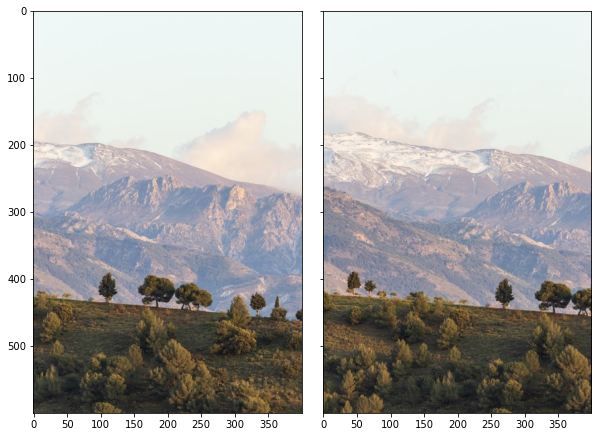


Finished in    0.936 seconds

STAGE 02: Compute each image's feature points
Finished in    0.308 seconds

STAGE 03: Computing feature matches among all image pairs:
im 1 ==> im 0
Computed 2 image  combinations
Finished in    0.120 seconds

STAGE 04: Prune image match pairs that are below homography quality threshold: inlierRatio < 0.8
Finished in    0.000 seconds

STAGE 05: Compute each image's best match (highest inlierRatio)
im 0 <==> im 1
	* => im1 inliers: 159, outliers: 2, ratio: 0.9876, matches: 161, accumDistance: 7027.37
im 1 <==> im 0
	* => im0 inliers: 161, outliers: 0, ratio: 1.0000, matches: 161, accumDistance: 7140.69
Finished in    0.000 seconds

STAGE 04: Determine connections between images:
Images: ['im0', 'im1']
im0 is connected to: im1
Finished in    0.000 seconds
placing im1
placing im0

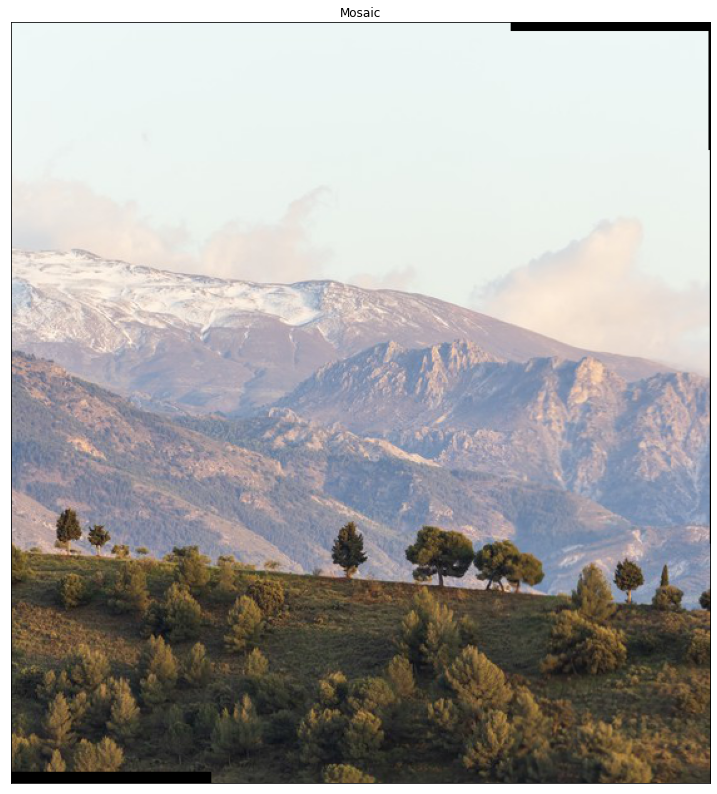

In [20]:
imgPathGlob = 'test-set01/*.jpg'

testSet1 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 2)
], False)

options.logOutput = True
options.logPlots = False
mosaics = Mosaics(testSet1.imagePaths)

#### Test Run 02
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 4      | 1             |       |                       | 1D               |


Input Images


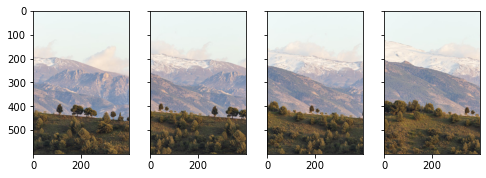

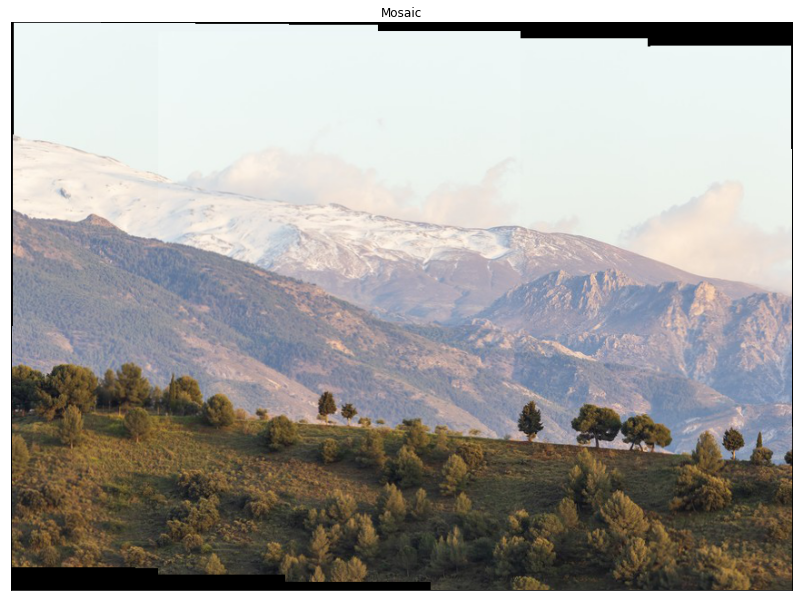

In [37]:
testSet2 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 4)
], False)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet2.imagePaths)

#### Test Run 03
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 8      | 1             |       |                       | 1D               |


Input Images


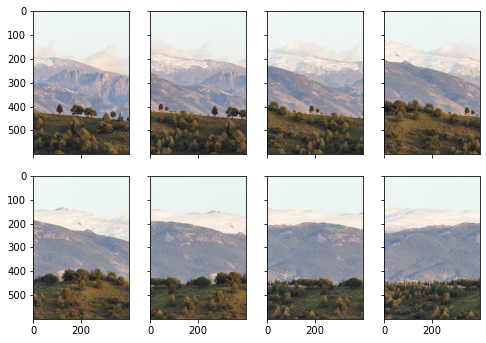

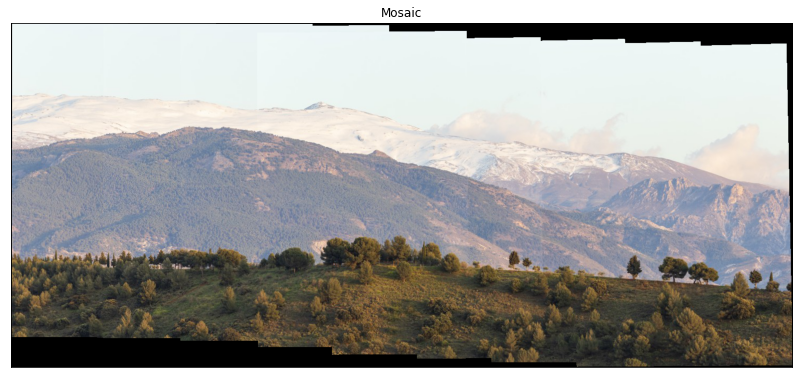

In [38]:
testSet3 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 8)
], False)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet3.imagePaths)

#### Test Run 04
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 16      | 1             |       |                       | 1D               |


Input Images


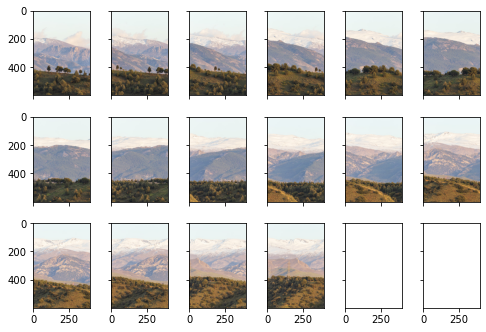

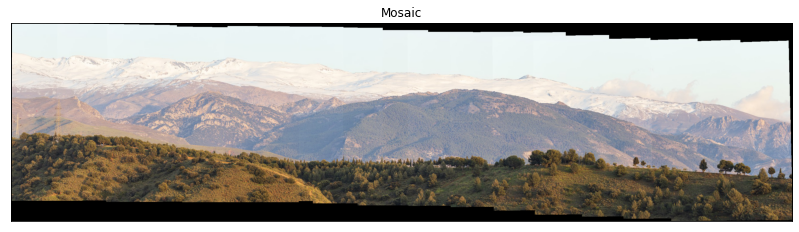

In [39]:
testSet4 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 16)
], False)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet4.imagePaths)

#### Test Run 05
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 39      | 1             |       |                       | 1D               |



Input Images


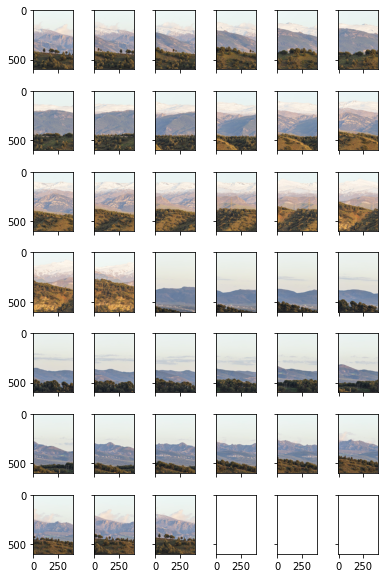

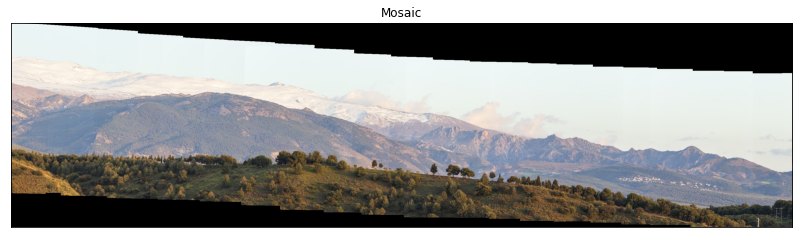

In [18]:
testSet5 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 39)
], False)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet5.imagePaths)

### Test Run 06
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 8      | 1             |   ✅    |                       | 1D               |


Input Images


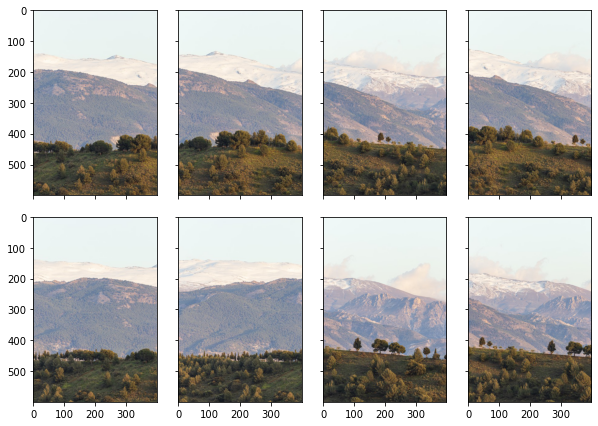

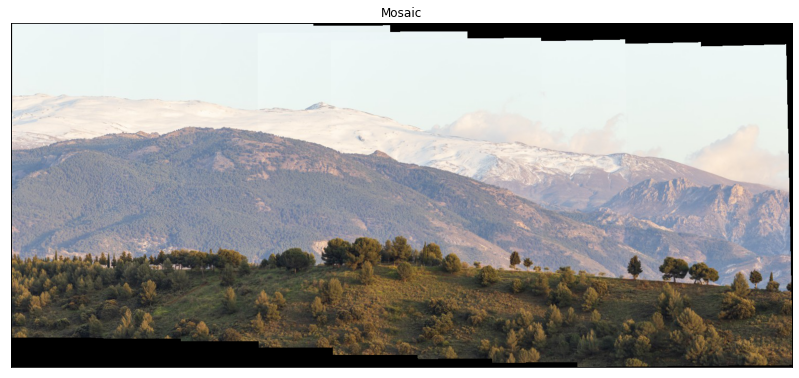

In [17]:
testSet6 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 8)
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet6.imagePaths)

#### Test Run 07
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 16      | 1             |   ✅    |                    | 1D               |


Input Images


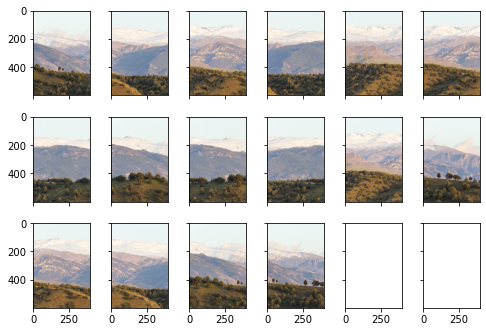

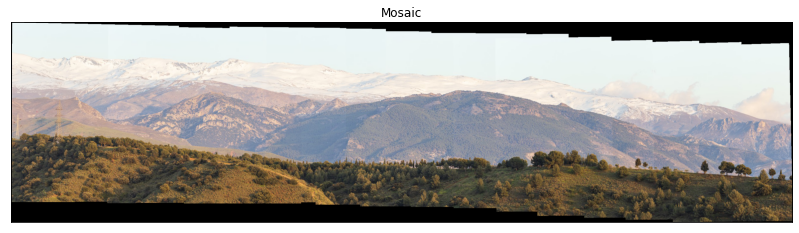

In [42]:
testSet7 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 16)
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet7.imagePaths)

#### Test Run 08
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 8      | 2             |   ✅    |                       | 1D               |


Input Images


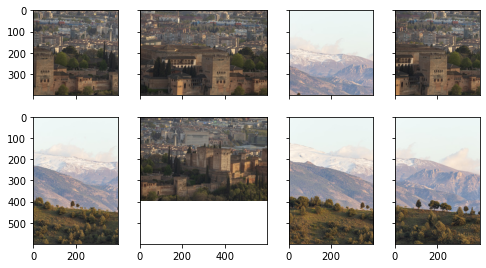

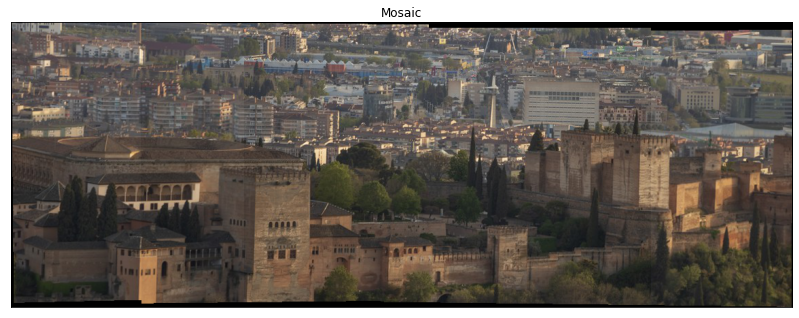

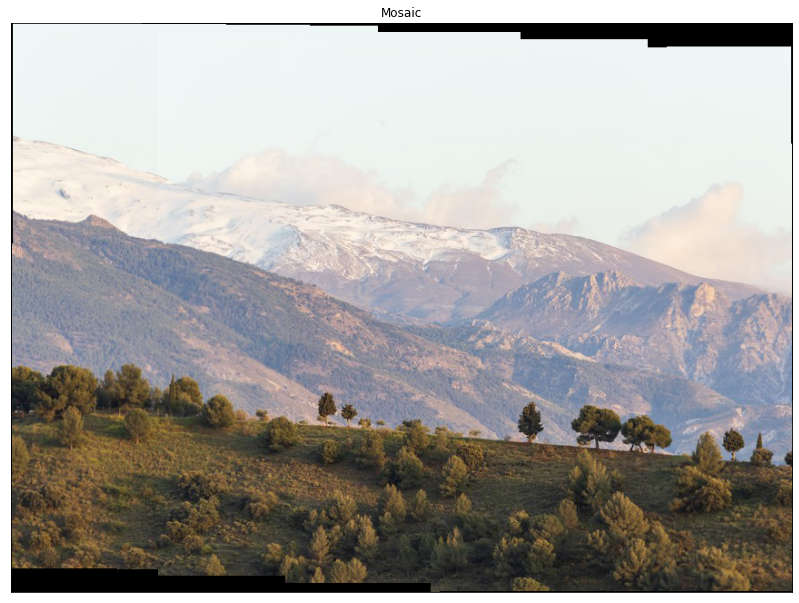

In [49]:
testSet8 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 4),
    MosaicTestSet(mosaicPathSets.alhambra, 1, 4),
    
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet8.imagePaths)

#### Test Run 09
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 16      | 2             |   ✅    |                       | 1D               |


Input Images


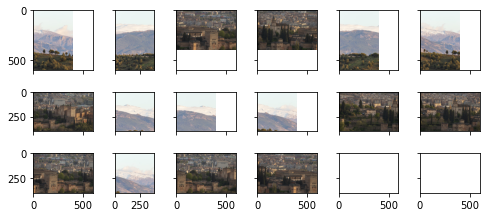

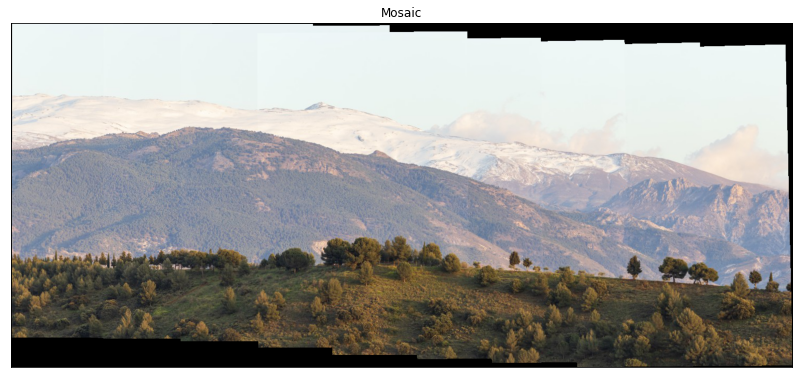

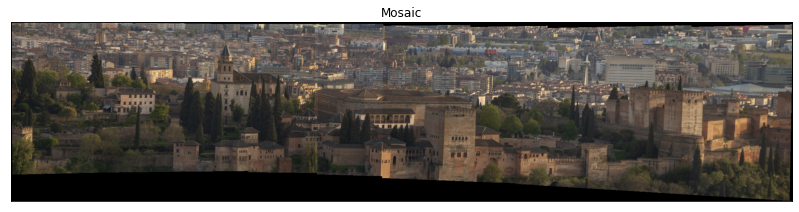

In [44]:
testSet9 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 8),
    MosaicTestSet(mosaicPathSets.alhambra, 1, 8),
    
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet9.imagePaths)

#### Test Run 10
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 32      | 2             |   ✅    |                       | 1D, 2D               |


Input Images


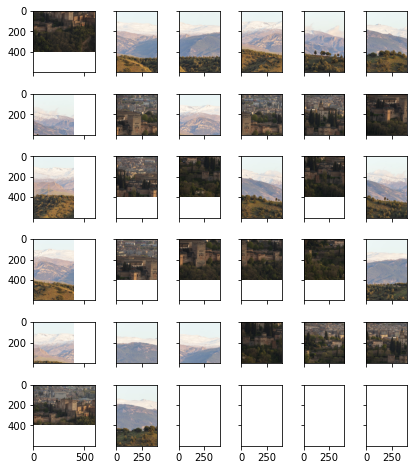

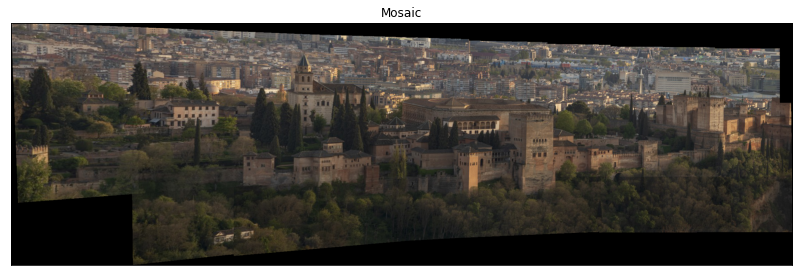

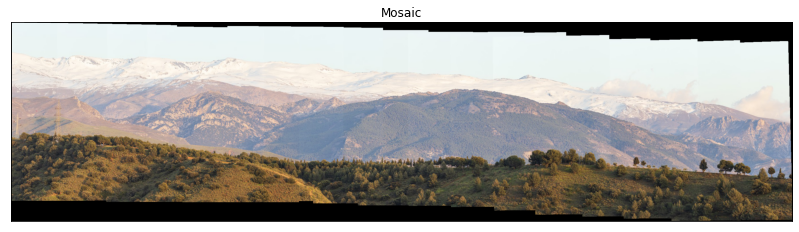

In [45]:
testSet10 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 16),
    MosaicTestSet(mosaicPathSets.alhambra, 2, 16),
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet10.imagePaths)

#### Test Run 11
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 34      | 5             |   ✅    |                       | 1D,2D              |


Input Images


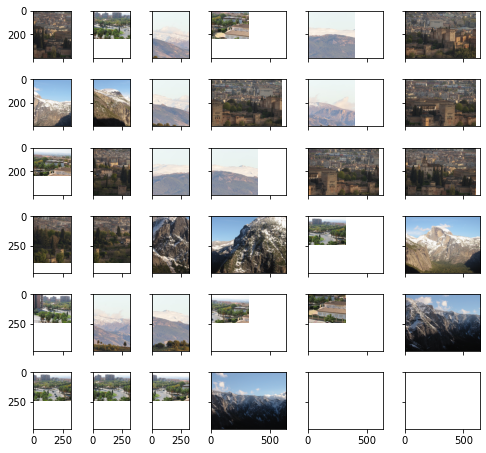

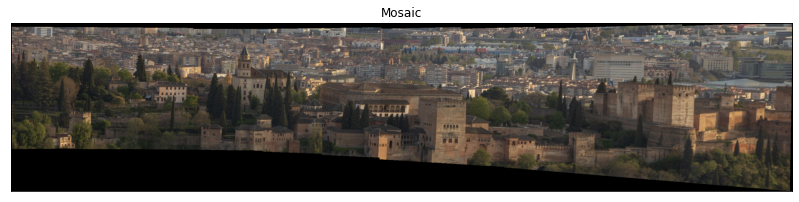

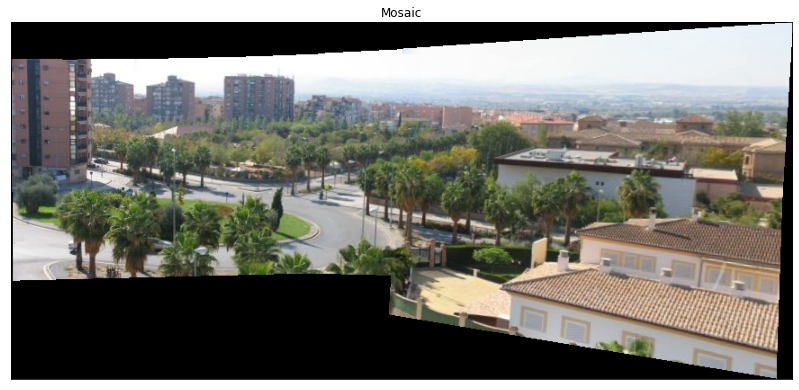

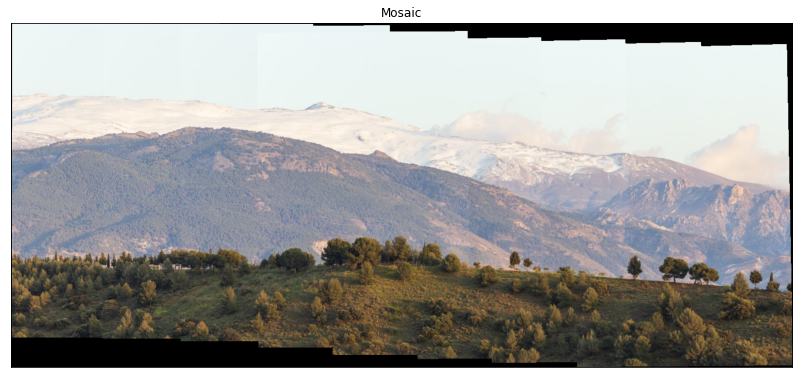

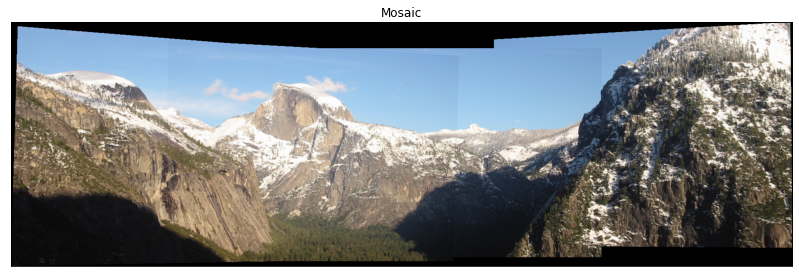

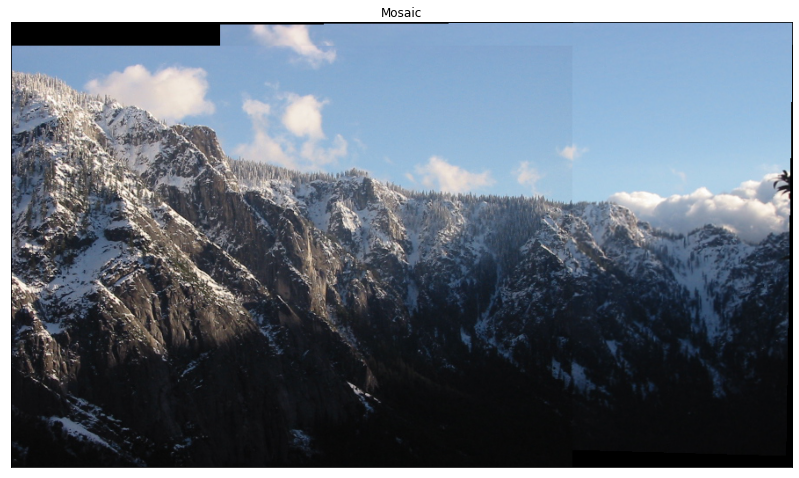

In [50]:
testSet11 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 8),
    MosaicTestSet(mosaicPathSets.alhambra, 1, 9),
     MosaicTestSet(mosaicPathSets.yosemite, 1, 5),
     MosaicTestSet(mosaicPathSets.yosemite2, 1, 2),
    MosaicTestSet(mosaicPathSets.granada, 1, 10),
], True)

options.logOutput = False
options.logPlots = False
mosaics = Mosaics(testSet11.imagePaths)

#### Test Run 12
| Images | Mosaic Groups | Mixed | Contains Noise Images | Mosaic Dimension |
|--------|---------------|-------|-----------------------|------------------|
| 35      | 5             |   ✅    |          ✅             | 1D, 2D              |

4.5.4

Input Images


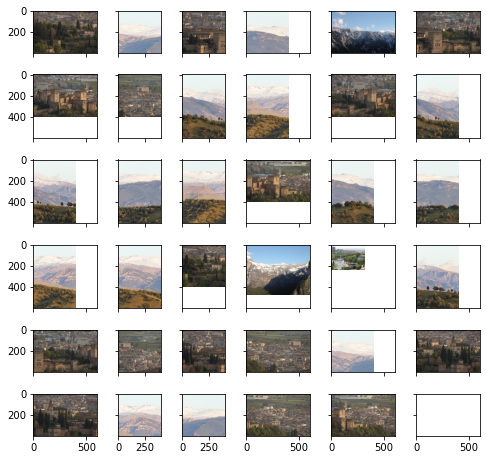


Connected Set 1


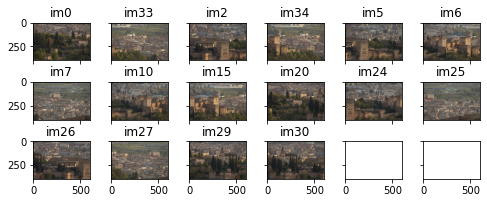


Connected Set 2


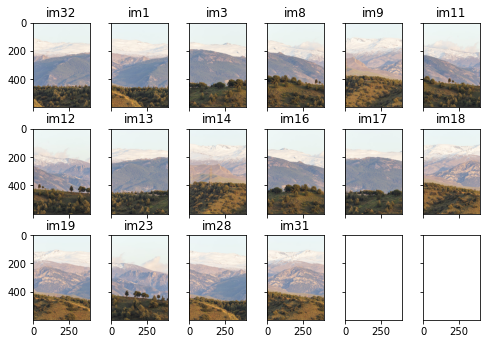

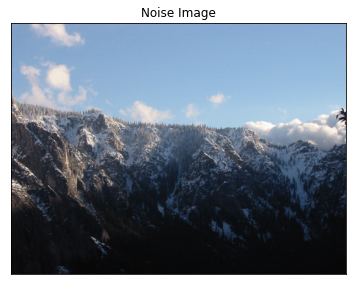

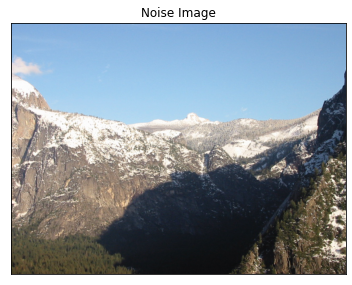

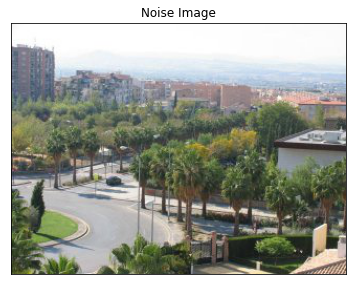

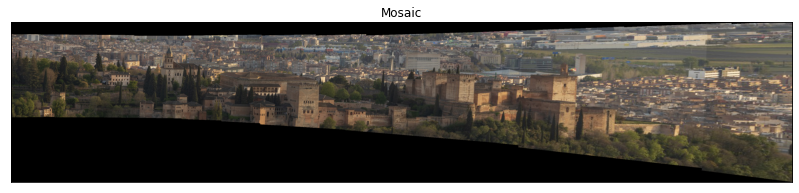

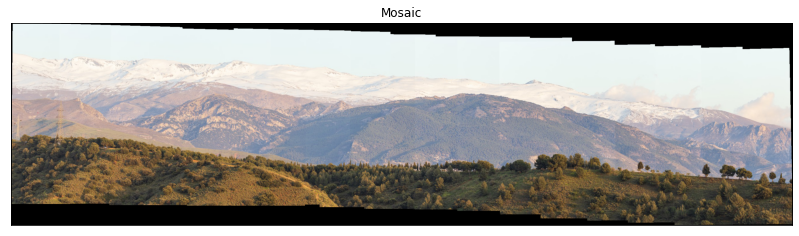

In [54]:
testSet12 = TestSetsGenerator([
    MosaicTestSet(mosaicPathSets.sierra, 1, 16),
    MosaicTestSet(mosaicPathSets.alhambra, 1, 16),
     MosaicTestSet(mosaicPathSets.yosemite, 1, 1),
     MosaicTestSet(mosaicPathSets.yosemite2, 1, 1),
    MosaicTestSet(mosaicPathSets.granada, 1, 1),
], True)

options.logOutput = False
options.logPlots = True
mosaics = Mosaics(testSet12.imagePaths)